<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Forecast-incoming-call-traffic" data-toc-modified-id="Forecast-incoming-call-traffic-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Forecast incoming call traffic</a></span><ul class="toc-item"><li><span><a href="#Load-data-and-view" data-toc-modified-id="Load-data-and-view-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Load data and view</a></span></li><li><span><a href="#Analyze-incoming-call-volume-measured-every-hour" data-toc-modified-id="Analyze-incoming-call-volume-measured-every-hour-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Analyze incoming call volume measured every hour</a></span></li><li><span><a href="#Decompose-the-time-series" data-toc-modified-id="Decompose-the-time-series-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Decompose the time series</a></span></li><li><span><a href="#Check-stationarity" data-toc-modified-id="Check-stationarity-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Check stationarity</a></span></li><li><span><a href="#Auto-correlation-and-Partial-correlation-plots" data-toc-modified-id="Auto-correlation-and-Partial-correlation-plots-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Auto correlation and Partial correlation plots</a></span></li><li><span><a href="#Multiple-seasonality-handling" data-toc-modified-id="Multiple-seasonality-handling-1.6"><span class="toc-item-num">1.6&nbsp;&nbsp;</span>Multiple seasonality handling</a></span></li><li><span><a href="#Working-hours" data-toc-modified-id="Working-hours-1.7"><span class="toc-item-num">1.7&nbsp;&nbsp;</span>Working hours</a></span></li><li><span><a href="#Train---test-data-split" data-toc-modified-id="Train---test-data-split-1.8"><span class="toc-item-num">1.8&nbsp;&nbsp;</span>Train - test data split</a></span></li><li><span><a href="#Model---Baseline" data-toc-modified-id="Model---Baseline-1.9"><span class="toc-item-num">1.9&nbsp;&nbsp;</span>Model - Baseline</a></span></li><li><span><a href="#Model---SARIMAX" data-toc-modified-id="Model---SARIMAX-1.10"><span class="toc-item-num">1.10&nbsp;&nbsp;</span>Model - SARIMAX</a></span></li><li><span><a href="#Model---fbprophet" data-toc-modified-id="Model---fbprophet-1.11"><span class="toc-item-num">1.11&nbsp;&nbsp;</span>Model - fbprophet</a></span></li><li><span><a href="#Summary-of-all-model-training-results" data-toc-modified-id="Summary-of-all-model-training-results-1.12"><span class="toc-item-num">1.12&nbsp;&nbsp;</span>Summary of all model training results</a></span></li><li><span><a href="#Future-work-:-Deep-learning-models-like-LSTM" data-toc-modified-id="Future-work-:-Deep-learning-models-like-LSTM-1.13"><span class="toc-item-num">1.13&nbsp;&nbsp;</span>Future work : Deep learning models like LSTM</a></span></li></ul></li></ul></div>

## Forecast incoming call traffic

In [23]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import calendar
from os.path import join
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import plotly.graph_objects as go
from plotly.subplots import make_subplots


import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from fbprophet import Prophet

register_matplotlib_converters()


### Load data and view

In [24]:
# data path
data_path = "C:\\Myprojects\\Dev\\Datasets\\Call_logs"


In [25]:
#Calls received
file = "callrecvd.txt"
df_call_recvd = pd.read_csv(join(data_path,file),sep='\t',header=[0],\
                            index_col=[0],parse_dates=['call_datehour_start'])

In [26]:
# Shape of the data - (records , columns)
df_call_recvd.shape

(8759, 1)

In [27]:
# Sample data
df_call_recvd.head(5)

,Call recvd
call_datehour_start,
1999-01-01 00:00:00,11
1999-01-01 01:00:00,3
1999-01-01 02:00:00,1
1999-01-01 03:00:00,2
1999-01-01 04:00:00,0


In [28]:
#Basic Info
df_call_recvd.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8759 entries, 1999-01-01 00:00:00 to 1999-12-31 22:00:00
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   Call recvd  8759 non-null   int64
dtypes: int64(1)
memory usage: 136.9 KB


### Analyze incoming call volume measured every hour

In [29]:
# plot graph objects using plotly
# Expected *kwargs for add trace
def plot_ts(time_ser_dict, title = 'Title', opacity = 1):
    fig = make_subplots(specs=[[{'secondary_y':True}]])
    for key in time_ser_dict:
        time_ser = time_ser_dict[key]['ts']
        kwargs = time_ser_dict[key]['kwargs']
        try : 
            sec_y = time_ser_dict[key]['secondary']['_y']
            yaxis_title = time_ser_dict[key]['secondary']['yaxis_title']
        except : 
            sec_y = False
            yaxis_title = None
        fig.add_trace(go.Scatter(x = time_ser.index, y = time_ser.values,
                         **kwargs),secondary_y=sec_y) 
        fig.update_yaxes(title_text=yaxis_title,secondary_y=sec_y)
    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True,width=1000,height=800)
    
    fig.show()

In [30]:
# plot calls received
time_ser_dict = {0:{'ts':df_call_recvd['Call recvd'], 'kwargs': 
                    {'line_color' : 'blue', 'opacity' : 1.0, 'name':'Calls received'}}}
plot_ts(time_ser_dict)


The time series has strong seasonality - weekly and monthly and weak Trend. Lets decompose the data for better view

### Decompose the time series

In [31]:
# Function to plot the decomposed timeseries data
def plot_components(decomp):
    time_ser_dict = {0:{'ts':decomp.seasonal, 'kwargs': 
                    {'line_color' : 'blue', 'opacity' : 1.0, 'name':'Decomposed timeseries'}}}
    time_ser_dict[0]['ts'] = decomp.seasonal
    plot_ts(time_ser_dict, title="seasonal component")
    time_ser_dict[0]['ts'] = decomp.trend
    plot_ts(time_ser_dict, title="Trend component")
    time_ser_dict[0]['ts'] = decomp.resid
    plot_ts(time_ser_dict, title="Residual component")

In [32]:
# Decompose original time series data
plot_components(sm.tsa.seasonal_decompose(df_call_recvd,period=24*7))

Lets do first order difference that will remove any linear trend

In [33]:
# Decompose original time series data - with first order difference
call_ts1 = df_call_recvd.diff().dropna()
plot_components(sm.tsa.seasonal_decompose(call_ts1,period=24*7))

A first order followed by 24th order difference can remove any seasonal trend

In [34]:
# Decompose original time series data  - with first order difference and 24th period difference
call_ts2 = df_call_recvd.diff().dropna().diff(24).dropna()
plot_components(sm.tsa.seasonal_decompose(call_ts2,period=24*7))

Lets figure if we have any weekly seasonal trend

In [35]:
# Decompose original time series data  - with first order difference, 24th period difference and 24x7th period difference
call_ts3 = df_call_recvd.diff().dropna().diff(24).dropna().diff(24*7).dropna()
plot_components(sm.tsa.seasonal_decompose(call_ts3,period=24*7))

### Check stationarity

In [36]:
def print_adfuller_res(time_ser):
    result = adfuller(time_ser)
    print("t-stat : {}\np-value : {}\nLags used : {}\nCritical values :{}"\
          .format(result[0],result[1],result[2],result[4]))

In [37]:
# No difference
print("No difference", "*"*40)
print_adfuller_res(df_call_recvd)
print("First difference", "*"*40)
print_adfuller_res(call_ts1)
print("First difference then 24th", "*"*40)
print_adfuller_res(call_ts2)
print("First difference then 24th then 24x7th", "*"*40)
print_adfuller_res(call_ts3)

No difference ****************************************
t-stat : -17.801544260307356
p-value : 3.2164361488917644e-30
Lags used : 37
Critical values :{'1%': -3.4311000545606776, '5%': -2.861871474145309, '10%': -2.566946438722175}
First difference ****************************************
t-stat : -16.08921979038468
p-value : 5.275530344770592e-29
Lags used : 36
Critical values :{'1%': -3.4311000545606776, '5%': -2.861871474145309, '10%': -2.566946438722175}
First difference then 24th ****************************************
t-stat : -23.128092420339485
p-value : 0.0
Lags used : 35
Critical values :{'1%': -3.4311020385052733, '5%': -2.8618723508056814, '10%': -2.566946905374546}
First difference then 24th then 24x7th ****************************************
t-stat : -26.55685139778508
p-value : 0.0
Lags used : 36
Critical values :{'1%': -3.4311169444484415, '5%': -2.8618789373870785, '10%': -2.566950411460539}


The original timeseries seems stationary. It is evident from the stationarity test, a first and then 24th order difference almost remove any trend and make the series completely stationary.

### Auto correlation and Partial correlation plots

Lets find out how many lags do we need to use for a good SARIMAX model

C:\Users\miraj\AppData\Local\Continuum\anaconda3\envs\tf15\lib\site-packages\statsmodels\graphics\tsaplots.py:353: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



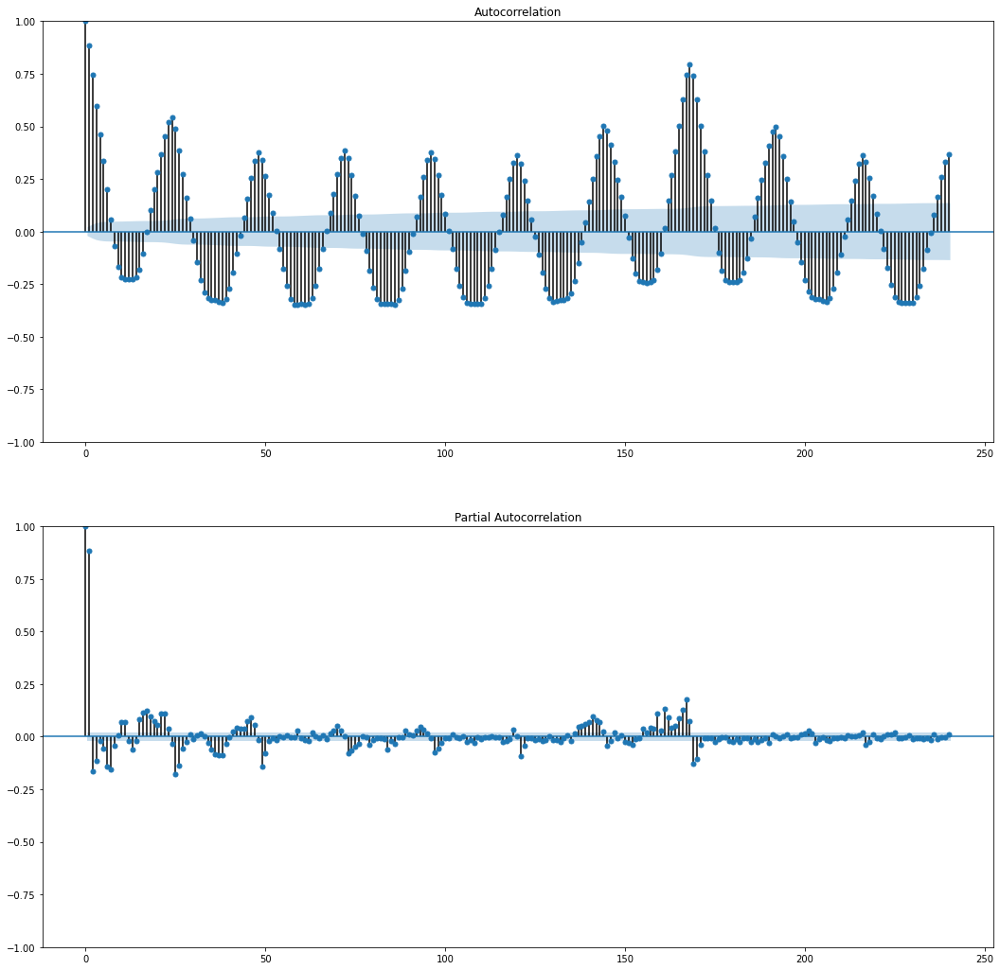

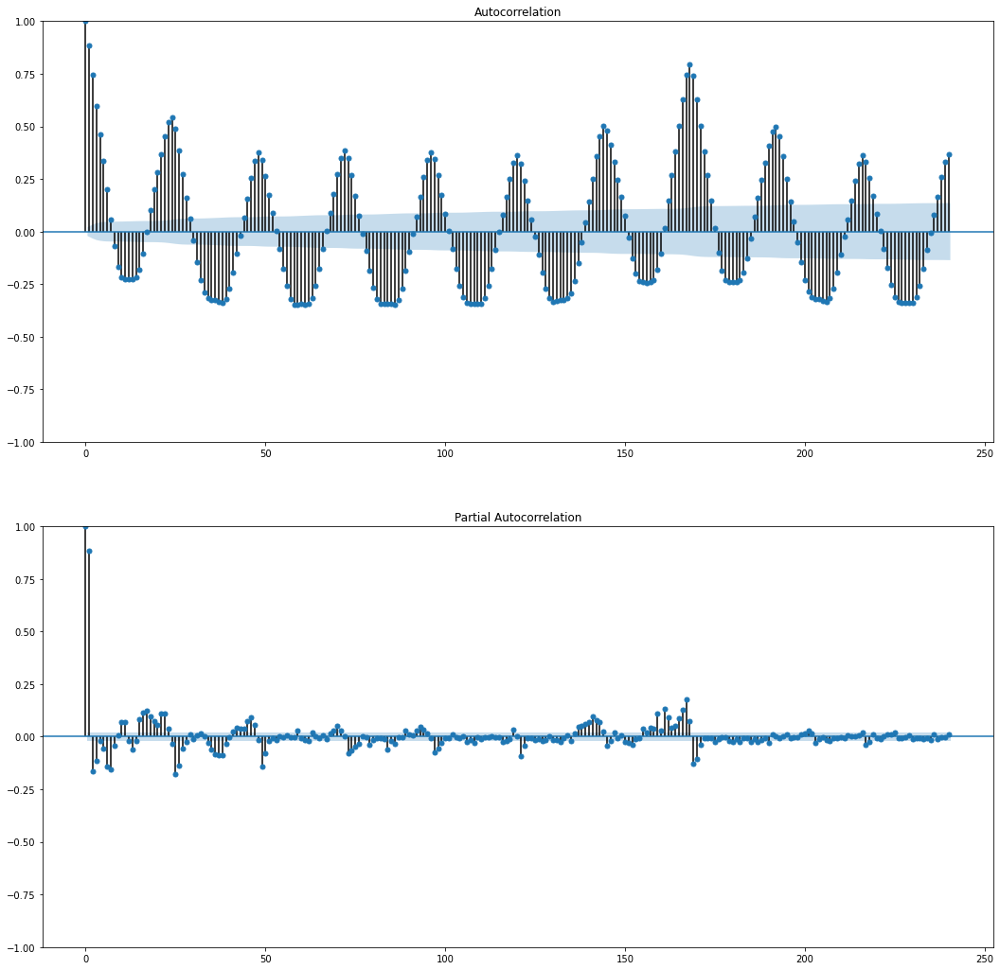

In [38]:
# ACF, PACF - original timeseries
num_lags=24*10
fig, (ax1,ax2) = plt.subplots(2,1, figsize=(18,18))
plot_acf(df_call_recvd,lags=num_lags,ax=ax1,alpha=0.05)
plot_pacf(df_call_recvd,lags=num_lags,ax=ax2,alpha=0.05)


C:\Users\miraj\AppData\Local\Continuum\anaconda3\envs\tf15\lib\site-packages\statsmodels\graphics\tsaplots.py:353: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



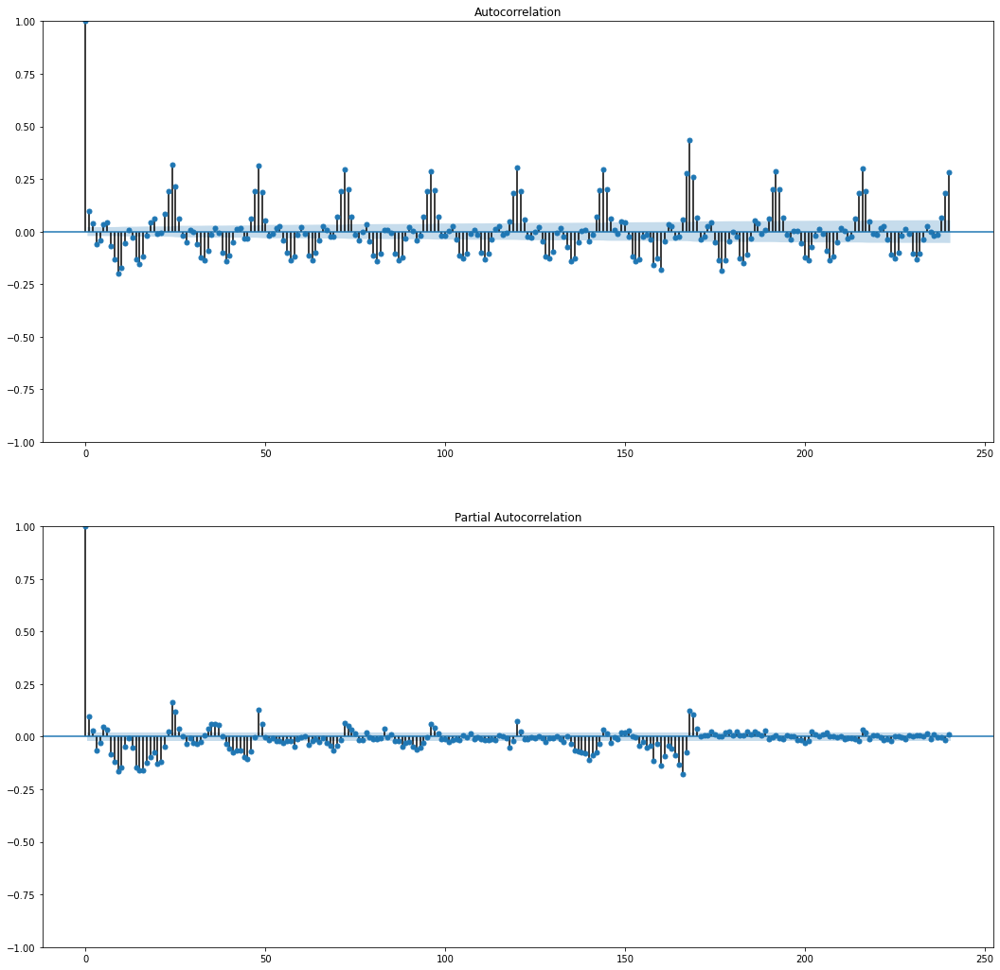

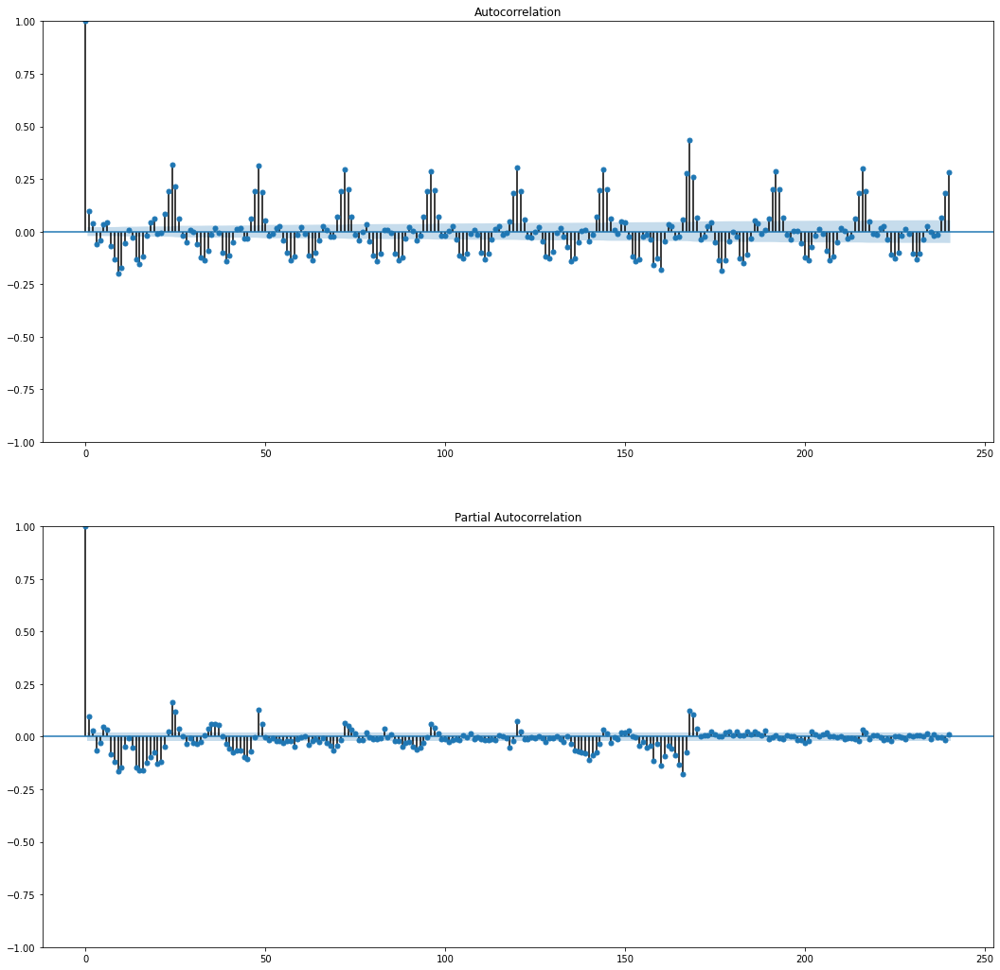

In [39]:
# ACF, PACF - timeseries with first order difference
num_lags=24*10
fig, (ax1,ax2) = plt.subplots(2,1, figsize=(18,18))
plot_acf(call_ts1,lags=num_lags,ax=ax1,alpha=0.05)
plot_pacf(call_ts1,lags=num_lags,ax=ax2,alpha=0.05)


C:\Users\miraj\AppData\Local\Continuum\anaconda3\envs\tf15\lib\site-packages\statsmodels\graphics\tsaplots.py:353: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



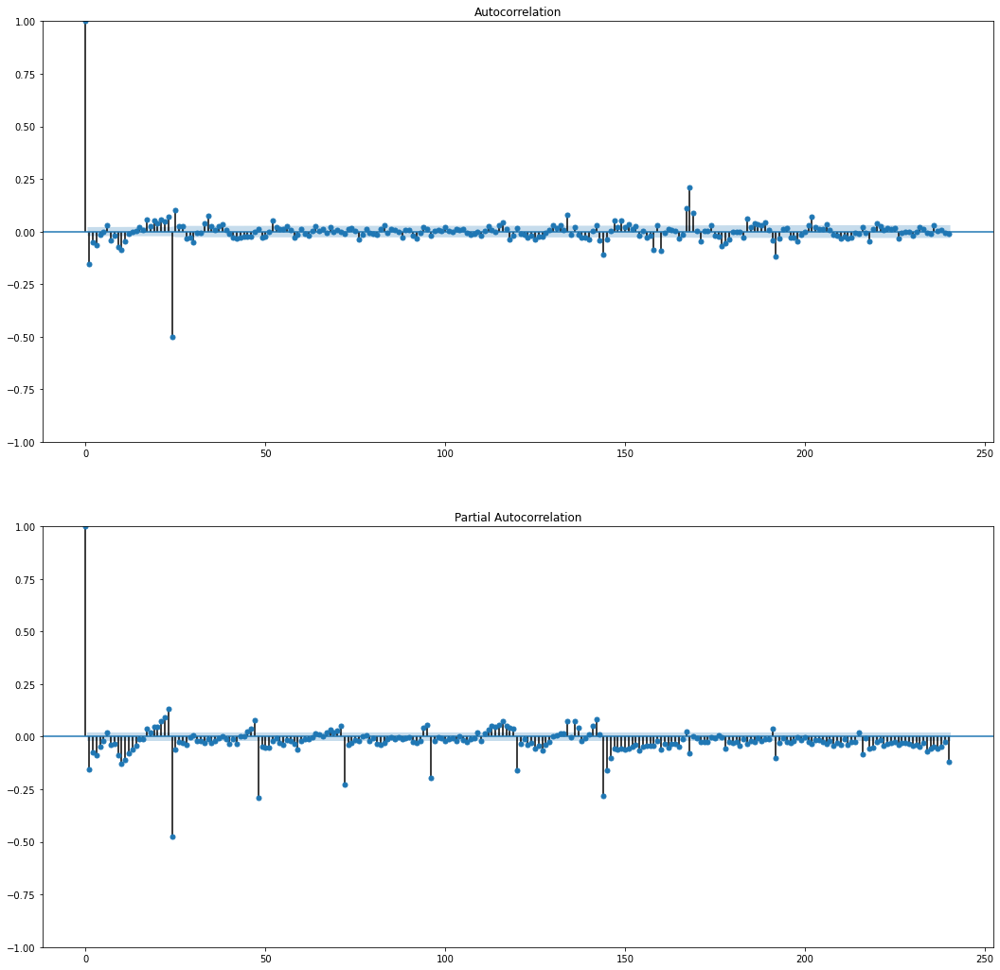

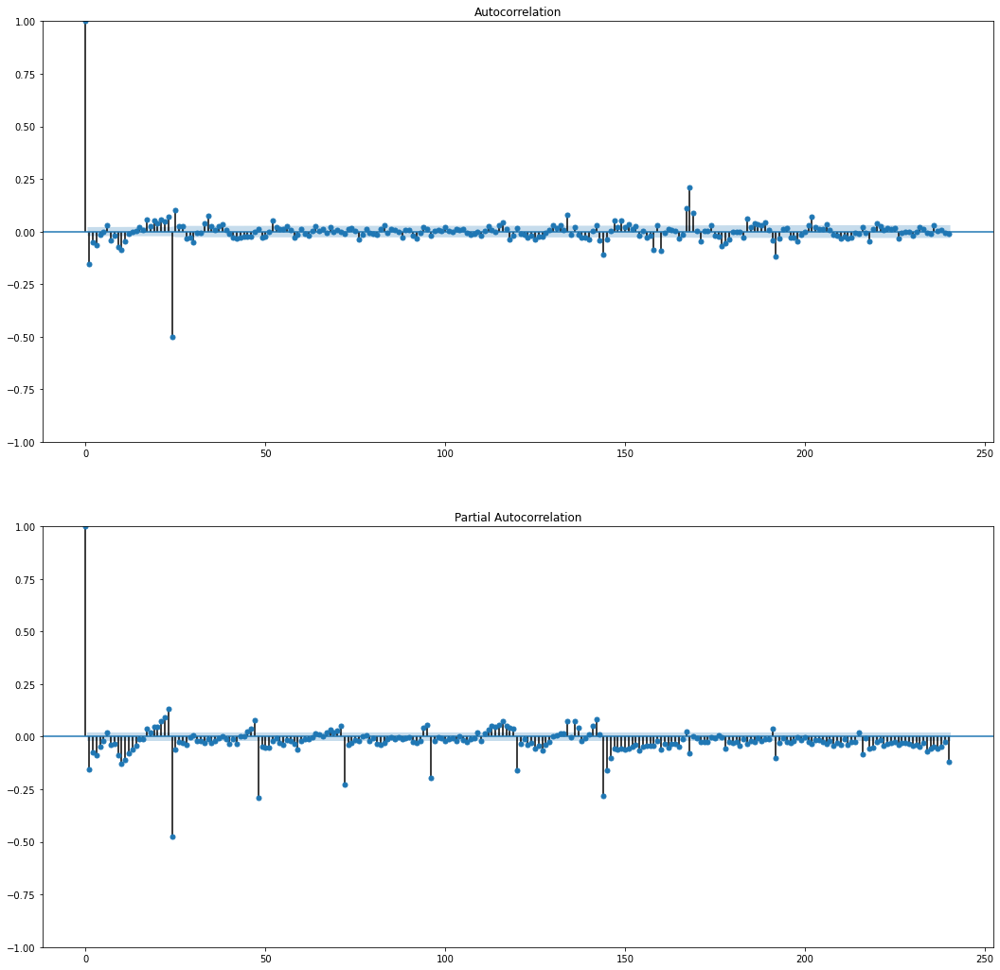

In [40]:
# ACF, PACF - timeseries with first order difference and then 24th order difference
num_lags=24*10
fig, (ax1,ax2) = plt.subplots(2,1, figsize=(18,18))
plot_acf(call_ts2,lags=num_lags,ax=ax1,alpha=0.05)
plot_pacf(call_ts2,lags=num_lags,ax=ax2,alpha=0.05)


From the above PACF & ACF graph, we could try few combination with (p,d,q) values - preferably with 24 period (daily) seasonality. However how do we also consider weekly seasonality ?

### Multiple seasonality handling

In [41]:
# fourier terms
def add_fourier_terms(df_i,day_fourier,week_fourier):
    df=df_i.copy()
    for i in range(1,day_fourier+1):
        df['day_sine'+str(i)] = df_call_recvd.index\
                         .to_series().apply(lambda x : \
                         np.sin(2*np.pi*i*x.hour/24))
        df['day_cosine'+str(i)] = df_call_recvd.index\
                         .to_series().apply(lambda x : \
                         np.cos(2*np.pi*i*x.hour/24))
        
    for i in range(1,week_fourier+1):
        df['week_sine'+str(i)] = df_call_recvd.index\
                         .to_series().apply(lambda x : \
                         np.sin(2*np.pi*i*x.weekday()/7))
        df['week_cosine'+str(i)] = df_call_recvd.index\
                         .to_series().apply(lambda x : \
                         np.cos(2*np.pi*i*x.weekday()/7))
    
    return(df)

In [44]:
# Add fourier terms. day_fourier & week_fouriers for hyper paramater tuning
df_call_recvd_fourier = add_fourier_terms(df_call_recvd,day_fourier=1,week_fourier=4)

Lets add additionaly sine term (for daily and weekly seasonality) that stays above 0 during active hours (5 days a week and 17 hours a day). We will see its plot to understand how it fits.

In [45]:
# Additional fourier terms - to have crest during active 5 days a week or 17 hours on those 5 regular working days
df_call_recvd_fourier['sine_wave_week'] = df_call_recvd.index\
                         .to_series().apply(lambda x : \
                         np.sin(2*np.pi*(x.weekday()*24 + x.hour)/24/7) + np.sin(3/4))


df_call_recvd_fourier['sine_wave_day'] = df_call_recvd.index\
                         .to_series().apply(lambda x : \
                         np.sin(2*np.pi*(x.hour+12+3)/24) + np.sin(5/2))

In [46]:
# plot calls received and additional sine waves
time_ser_dict = {0:{'ts':df_call_recvd_fourier['Call recvd'], 'kwargs': 
                    {'line_color' : 'lightgrey', 'opacity' : 1.0, 'name':'Calls received'}},
                 1:{'ts':df_call_recvd_fourier['sine_wave_week']*200, 'kwargs': 
                    {'line_color' : 'blue', 'opacity' : 1.0, 'name':'Sinewave-week'}},
                 2:{'ts':df_call_recvd_fourier['sine_wave_day']*200, 'kwargs': 
                    {'line_color' : 'green', 'opacity' : 1.0, 'name':'Sinewave-day'}}
                }
plot_ts(time_ser_dict, title='calls received and additional sine waves for fourier series terms')


In [47]:
# check columns we have
df_call_recvd_fourier.columns

Index(['Call recvd', 'day_sine1', 'day_cosine1', 'week_sine1', 'week_cosine1',
       'week_sine2', 'week_cosine2', 'week_sine3', 'week_cosine3',
       'week_sine4', 'week_cosine4', 'sine_wave_week', 'sine_wave_day'],
      dtype='object')

### Working hours

In [48]:
# Add working hours component
index = df_call_recvd['Call recvd'].index
values = [0 if (idx.weekday() == 4 and idx.hour >= 14) | (idx.weekday() == 5 and idx.hour < 20)  \
          | (idx.hour < 7)
          else 1 for idx in index]
df_call_recvd_fourier['working_hours'] = pd.Series(values,index=index)

In [49]:
# plot calls received vs working hours
time_ser_dict = {0:{'ts':df_call_recvd_fourier['Call recvd'], 'kwargs': 
                    {'line_color' : 'lightgrey', 'opacity' : 1.0, 'name':'Calls received'}},
                1:{'ts':df_call_recvd_fourier['working_hours']*200, 'kwargs': 
                    {'line_color' : 'green', 'opacity' : 1.0, 'name':'Working hours'}}}
plot_ts(time_ser_dict,title='calls received and working hours')


### Train - test data split

We will split 1 year data in 11 months for training and last 1 month for test. We would compare the models purely on the errors in the prediction for the 12th month.

In [50]:
# train and test data index
train_index= [idx for idx in df_call_recvd.index if idx.month != 12]
test_index= [idx for idx in df_call_recvd.index if idx.month == 12]

#split endogenous and exogenous data - for train-test split
Y_train = df_call_recvd_fourier.loc[train_index,'Call recvd']
X_train = df_call_recvd_fourier.loc[train_index,df_call_recvd_fourier.columns[1:]]
Y_test= df_call_recvd_fourier.loc[test_index,'Call recvd']
X_test = df_call_recvd_fourier.loc[test_index,df_call_recvd_fourier.columns[1:]]

### Model - Baseline

Our baseline model would be to repeat the pattern reported in the 31 days of the last 5 week period of train data. This is to preserve weekly seasonality

In [51]:
# go 5 weeks back to cover 31 days
baseline_pred_index = df_call_recvd_fourier.index[(-len(test_index)-24*7*5):-24*7*5]
pred = df_call_recvd_fourier.loc[baseline_pred_index,'Call recvd']
pred.index = test_index

In [52]:
# plot Actual vs predicted
time_ser_dict = {0:{'ts':df_call_recvd_fourier['Call recvd'], 'kwargs': 
                    {'line_color' : 'lightgrey', 'opacity' : 1.0, 'name':'Calls received - actual'}},
                1:{'ts':pred, 'kwargs': 
                    {'line_color' : 'green', 'opacity' : 1.0, 'name':'Prediction'}}}
plot_ts(time_ser_dict,title = "Call actual vs predicted - baseline mode")


In [53]:
# Print & store error statistics
def error_stats(y_actual, y_pred, Model_desc = None):
    
    #Ensure array is numpy array 
    if isinstance(y_actual, np.ndarray):
        y_actual = y_actual
    else:
        y_actual = y_actual.to_numpy()
        
    if isinstance(y_pred, np.ndarray):
        y_pred = y_pred
    else:
        y_pred = y_pred.to_numpy()
    
        
    print('Error metrics for model {} **************'.format(Model_desc))
    
    # Print RMSE
    RMSE = np.sqrt(mean_squared_error(y_actual, y_pred))
    print("Root mean squared error (RMSE): %.2f" % RMSE)
    
    # Explained variance (R2) score
    R2 = r2_score(y_actual, y_pred)
    print('Explained variance (R2 score): %.2f' % R2 )

    # Mean Absolute error
    MAE = mean_absolute_error(y_actual, y_pred)
    print('Mean Absolute Error (MAE): %.2f' % MAE)

       
    
    # Build  the summary of statistics
    summary = dict()
    summary['Model'] = [Model_desc]
    summary['RMSE'] = [RMSE]
    summary['R2'] = [R2]
    summary['MAE'] = [MAE]
    
    return(summary)

In [100]:
# Initialize dict and dataframe
summary_stats = dict()
df_summary = pd.DataFrame()

In [101]:
# Print and return summary stats
summary_stats = error_stats(Y_test, pred, Model_desc = 'Baseline - repeat last few weeks - Test')

# Store the summary in dataframe
df_summary = df_summary.append(pd.DataFrame.from_dict(summary_stats),ignore_index=True)

Error metrics for model Baseline - repeat last few weeks - Test **************
Root mean squared error (RMSE): 23.05
Explained variance (R2 score): 0.84
Mean Absolute Error (MAE): 13.36


In [102]:
# Plot residuals
def plot_res(Y_test,pred):
    residuals = Y_test - pred
    plt.figure(figsize=(10,4))
    plt.plot(residuals)
    plt.axhline(0,linestyle='--',color='k')
    plt.title('Residuals from model on test dataset', fontsize=20)
    plt.ylabel('Error',fontsize=16)

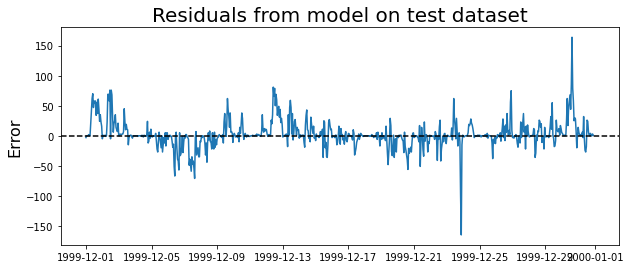

In [103]:
# Plot residuals
plot_res(Y_test,pred)

### Model - SARIMAX

In [58]:
# define SARIMAX model
normal_order = (2,1,2)
seasonal_order = (2,1,2,24)
sarimax_model = SARIMAX(Y_train,order=normal_order,\
                seasonal_order = seasonal_order, exog=X_train)  #trend='c'

C:\Users\miraj\AppData\Local\Continuum\anaconda3\envs\tf15\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

C:\Users\miraj\AppData\Local\Continuum\anaconda3\envs\tf15\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



In [59]:
%%time
# Train the model
sarimax_model_fit = sarimax_model.fit()

C:\Users\miraj\AppData\Local\Continuum\anaconda3\envs\tf15\lib\site-packages\statsmodels\base\model.py:606: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Wall time: 46min 53s


In [94]:
# print model summary
print(sarimax_model_fit.summary())

                                     SARIMAX Results                                      
Dep. Variable:                         Call recvd   No. Observations:                 8016
Model:             SARIMAX(2, 1, 2)x(2, 1, 2, 24)   Log Likelihood              -35476.054
Date:                            Tue, 12 Apr 2022   AIC                          70996.107
Time:                                    17:28:41   BIC                          71149.801
Sample:                                01-01-1999   HQIC                         71048.717
                                     - 11-30-1999                                         
Covariance Type:                              opg                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
day_sine1      -1.563e-05      6.154  -2.54e-06      1.000     -12.061      12.061
day_cosine1     -6.07e-

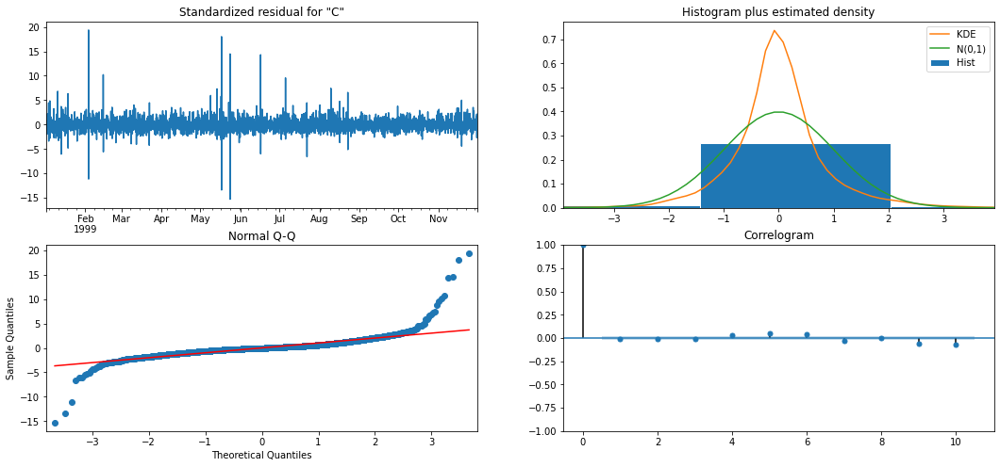

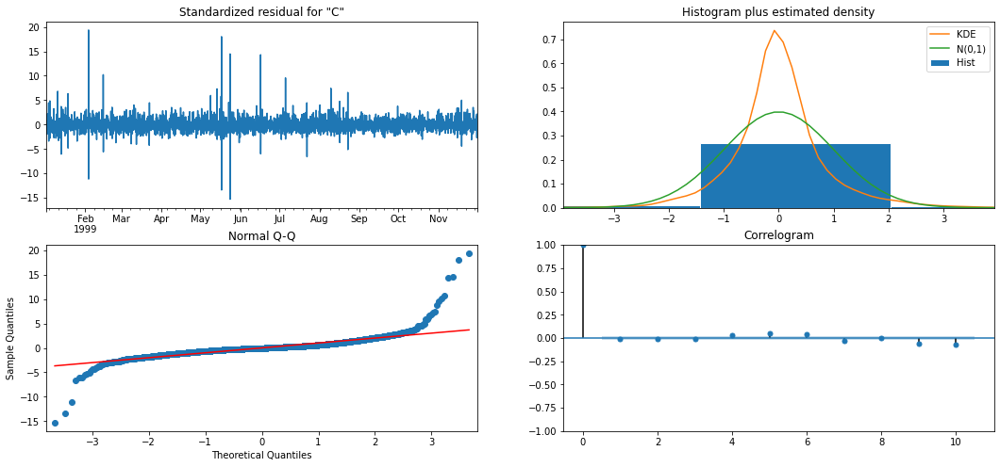

In [95]:
# plot Model diagnostic data
sarimax_model_fit.plot_diagnostics(figsize=(18,8))

In [104]:
# model prediction
pred_sarimax = sarimax_model_fit.get_prediction(start=Y_test.index[0], \
                                end=Y_test.index[-1], 
                                dynamic=True,
                                exog=X_test)
pred_ci = pred_sarimax.conf_int()

In [105]:
# filter prediction based on working hours
def filter_pred(y_in, working_hours):
    y_out= pd.Series(np.array(y_in)*np.array(working_hours),index=y_in.index)
    y_out = y_out.apply(lambda x : x if x > 0 else 0)
    return y_out

In [106]:
#prediction
pred_sarimax_mean = filter_pred(pred_sarimax.predicted_mean,X_test['working_hours'])
pred_sarimax_min = filter_pred(pred_ci.iloc[:,0],X_test['working_hours'])
pred_sarimax_max = filter_pred(pred_ci.iloc[:,1],X_test['working_hours'])

In [107]:
# Print and return summary stats
summary_stats = error_stats(Y_test, pred_sarimax_mean, Model_desc = 'SARIMAX with fourier - Test')

# Store the summary in dataframe
df_summary = df_summary.append(pd.DataFrame.from_dict(summary_stats),ignore_index=True)

Error metrics for model SARIMAX with fourier - Test **************
Root mean squared error (RMSE): 24.68
Explained variance (R2 score): 0.82
Mean Absolute Error (MAE): 14.95


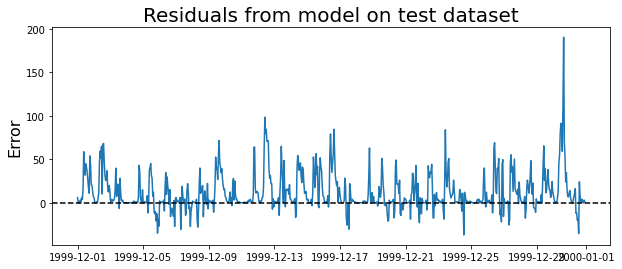

In [108]:
# residuals
plot_res(Y_test ,pred_sarimax_mean)

In [109]:
# plot Actual vs predicted
time_ser_dict = {0:{'ts':df_call_recvd_fourier['Call recvd'], 'kwargs': 
                    {'line_color' : 'green', 'opacity' : 1.0, 'name':'Calls received - actual'}},
                1:{'ts':pred_sarimax_mean, 'kwargs': 
                    {'line_color' : 'rgba(0,0,255,1)', 'opacity' : 1.0, 'name' : 'Mean prediction'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Calls received'}},
                2:{'ts':pred_sarimax_min, 'kwargs': 
                    {'line_color' : None,'name' : 'Min calls','showlegend':False,\
                     'mode':'lines','line_color':'rgba(0,0,255,0.2)'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Calls received'}},
                3:{'ts':pred_sarimax_max, 'kwargs': 
                    {'fill':'tonexty','fillcolor':'rgba(0,0,255,0.2)', \
                     'name' : 'Max calls','showlegend':False,'mode':'lines','line_color':'rgba(0,0,255,0.2)'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Calls received'}}
                }
plot_ts(time_ser_dict,title = "Call actual vs predicted - SARIMAX with Fourier series model")



### Model - fbprophet

In [121]:
# define the model
prophet_model = Prophet(growth='linear', interval_width = 0.95,
                weekly_seasonality='auto',
                daily_seasonality='auto',
                seasonality_mode='additive'
              )
# Add working hours
prophet_model.add_regressor('working_hours',mode='additive', standardize='auto')

# Add holidays
#prophet_model.add_country_holidays(country_name='IL')

In [122]:
# train data & test data prep
train_data = pd.merge(Y_train, X_train,left_index=True, right_index=True).reset_index()\
                .rename(columns = {'Call recvd':'y', 'call_datehour_start':'ds'})

test_data = pd.merge(Y_test, X_test,left_index=True, right_index=True).reset_index()\
                .rename(columns = {'Call recvd':'y', 'call_datehour_start':'ds'})

In [123]:
%%time
# fit the model
prophet_model.fit(train_data)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wall time: 16.7 s


In [124]:
# prediction
pred_fbprophet = prophet_model.predict(test_data)

In [125]:
#prediction
pred_fb_mean = filter_pred(pred_fbprophet.set_index('ds')['yhat'],X_test['working_hours'])
pred_fb_min = filter_pred(pred_fbprophet.set_index('ds')['yhat_lower'],X_test['working_hours'])
pred_fb_max = filter_pred(pred_fbprophet.set_index('ds')['yhat_upper'],X_test['working_hours'])

In [126]:
# Print and return summary stats
summary_stats = error_stats(Y_test, pred_fb_mean, Model_desc = 'fbprophet - test')

# Store the summary in dataframe
df_summary = df_summary.append(pd.DataFrame.from_dict(summary_stats),ignore_index=True)

Error metrics for model fbprophet - test **************
Root mean squared error (RMSE): 22.12
Explained variance (R2 score): 0.85
Mean Absolute Error (MAE): 14.12


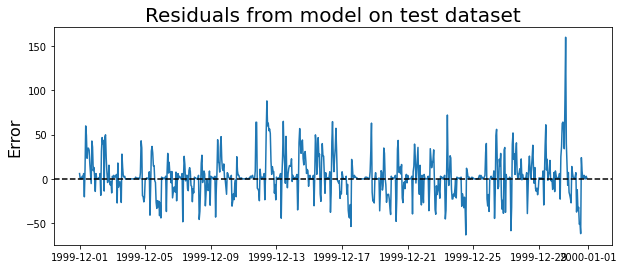

In [127]:
# residuals
plot_res(Y_test ,pred_fb_mean)


In [128]:
# plot Actual vs predicted
time_ser_dict = {0:{'ts':df_call_recvd_fourier['Call recvd'], 'kwargs': 
                    {'line_color' : 'green', 'opacity' : 1.0, 'name':'Calls received - actual'}},
                1:{'ts':pred_fb_mean, 'kwargs': 
                    {'line_color' : 'rgba(0,0,255,1)', 'opacity' : 1.0, 'name' : 'Mean prediction'},
                   'secondary':
                   {'_y':False,'yaxis_title':'No of Agents, Active calls'}},
                2:{'ts':pred_fb_min, 'kwargs': 
                    {'line_color' : None,'name' : 'Min calls','showlegend':False,\
                     'mode':'lines','line_color':'rgba(0,0,255,0.2)'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Predicton - lower end'}},
                3:{'ts':pred_fb_max, 'kwargs': 
                    {'fill':'tonexty','fillcolor':'rgba(0,0,255,0.2)', \
                     'name' : 'Max calls','showlegend':False,'mode':'lines','line_color':'rgba(0,0,255,0.2)'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Predicton - upper end'}}
                }
plot_ts(time_ser_dict,title = "Call actual vs predicted - fbprophet with holiday")


### Summary of all model training results

In [139]:
#summary of all models
df_summary

,Model,RMSE,R2,MAE
0,Baseline - repeat last few weeks - Test,23.045189,0.840038,13.358008
1,SARIMAX with fourier - Test,24.679802,0.816541,14.950336
2,fbprophet - test,22.123084,0.852583,14.124360


SARIMAX has surprisingly not done well when compared to Baseline. We can try few more hyper parameters however as you may have noticed this model takes lot of time to train, especially when you have higher value of p,d and q. fbprophet has done quite well and this has been our best model when you compare the RMSE and R2 score

### Future work : Deep learning models like LSTM 